#Import Library & Read Data

In [221]:
!pip install hvplot

In [222]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import holoviews as hv
import pandas as pd
import hvplot.pandas
import numpy as np
import seaborn as sns

data = pd.read_csv('https://tinyurl.com/ChrisCoDV/001127898/DailyCustomers.csv',index_col=0)
data.index = pd.to_datetime(data.index)



In [223]:
print(data)
print(data.head(20))
print(data.tail(20))
print(data.describe())
print(data.sum())

            MUY  XSV  ZSD  OSG  RGS  ATT  ...  BTB  MAJ  WMB  TSE  AEI  CNQ
Date                                      ...                              
2019-01-01  309   76    0  400  419   59  ...   81    0   86   98    0   62
2019-01-02  368   92    0  447  441   50  ...   77    0   91   85    0   55
2019-01-03  363   71    0  400  540   66  ...   72    0   83   80    0   84
2019-01-04  225  105    0  407  497   49  ...   76    0   77   78    0   70
2019-01-05  311   72    0  319  395   42  ...   79    0   91   88    0   59
...         ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...
2019-12-27  245    0   48  401  405   57  ...   87   77   92   87   31   73
2019-12-28  346    0   60  360  495   61  ...   88    0   93   81   28   61
2019-12-29  359    0  114  420  445   68  ...   86  172   99   94  102   84
2019-12-30  409    0   37  429  464   77  ...   90  138   93   90   57   55
2019-12-31  354    0  123  497  552   65  ...   77  180   94   95   52   51

[365 rows x

**Explanation:**

The above data shows the data about the number of customer that visit the particular stores in the year 2019. There are total 365 rows as 365 days showing daily data of the number of customer visiting the particular store  and 40 columns represents 40 stores with each store names indicated by distinct combination of letters. Where the head() and tail() functions shows the data of first 20 records and last 20 records respectively. However the function Describe() shows all statistics of the whole dataset, such as Mean,sum, Standard deviation etc. of all particular columns.

#Summary of all dataframe

In [224]:
StoreMarketing = pd.read_csv('https://tinyurl.com/ChrisCoDV/001127898/StoreMarketing.csv', index_col=0)
StoreOverheads = pd.read_csv('https://tinyurl.com/ChrisCoDV/001127898/StoreOverheads.csv',index_col=0)
StoreSize = pd.read_csv('https://tinyurl.com/ChrisCoDV/001127898/StoreSize.csv',index_col=0)
StoreStaff = pd.read_csv('https://tinyurl.com/ChrisCoDV/001127898/StoreStaff.csv',index_col=0)

print(StoreMarketing)
print(StoreOverheads)
print(StoreSize)
print(StoreStaff)

Summary_data = pd.DataFrame(index=data.columns)
Summary_data['Total_customers'] = data.sum().values
Summary_data['StoreMarketing'] = StoreMarketing.values
Summary_data['StoreSize'] = StoreSize.values
Summary_data['StoreOverheads'] = StoreOverheads.values
Summary_data['StoreStaff'] = StoreStaff.values

print(Summary_data.head(40))

     Marketing (£)
Id                
MUY          10000
XSV           2000
ZSD           1000
OSG          18000
RGS          15000
ATT           3000
ZMS           2000
CFG           4000
UMU           3000
NAQ          15000
UGJ           3000
PAA          18000
SMM          36000
PGL          15000
DZT           3000
VYZ           3000
YGY           4000
DTJ           2000
QMD          19000
WYG           4000
YYO           1000
RAH          30000
BZM           3000
EFN           4000
OMV          11000
SGA          37000
VSM           3000
NGB           1000
NMO           2000
TAP           3000
QSN          33000
WGR           2000
XML           3000
ENY           4000
BTB           3000
MAJ           1000
WMB           3000
TSE           4000
AEI           1000
CNQ           3000
     Overheads (£)
Id                
MUY          24000
XSV          41000
ZSD          32000
OSG          55000
RGS          91000
ATT          62000
ZMS          16000
CFG          78000
UMU         

**Explanation:**

The above data represents the Summary of all dataframe into one dataset. Also, each print function print the values of each dataframe.

# Bar-Graph to show numbers of Customers visiting the particular store in year 2019.

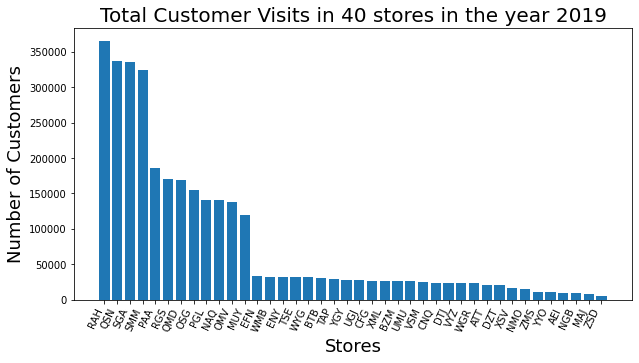

In [225]:
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1) 

plt.figure(figsize=(10, 5))
x_pos = np.arange(len(data.columns))
plt.bar(x_pos, data.sum(), align='center')
plt.xticks(x_pos, data.columns,)
plt.xticks(rotation=65, ha='right')
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Total Customer Visits in 40 stores in the year 2019', fontsize=20)
plt.show()


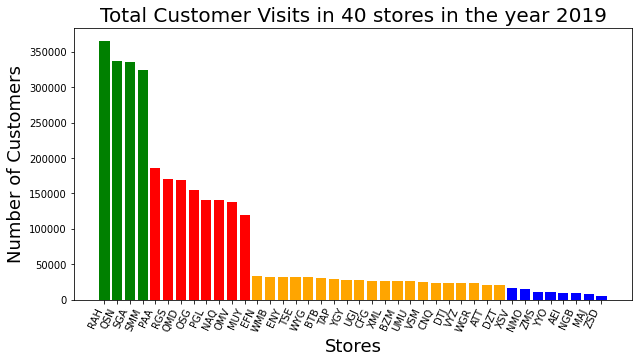

In [226]:
colors=[]

for name in data.columns:
  total_customers = data[name].sum()
  if total_customers > 300000:
     color = 'green'
  elif total_customers > 100000:
     color = 'red'
  elif (total_customers < 50000) & (total_customers > 20000):   
     color = 'orange'
  elif total_customers < 20000:   
     color = 'blue'
  else: 
     color = 'black'
  colors.append(color)   

plt.figure(figsize=(10, 5))
x_pos = np.arange(len(data.columns))
plt.bar(x_pos, data.sum(), align='center', color=colors)
plt.xticks(x_pos, data.columns,)
plt.xticks(rotation=65, ha='right')
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Total Customer Visits in 40 stores in the year 2019', fontsize=20)
plt.show()

**Explanation:**
The first Bar-graph shows the Total customers visiting the different stores in the year 2019. It can be seen from the Bar-graph that there is 40 stores on the X-axix and Y-axis represents total Numbers of Customer visits in the year 2019.In which I have segmented the whole dataframe into three categories based on the customer visits. we can see that first four stores such as RAH,QSN,SGA and SMM have a high volume of Customer visit(more than 300000 customers) however other eight store such as PAA,RGS,QMD,OSG,PGL,NAQ,OMV and MUY have a medium volume customer visits(between 100000-200000 customers). On ther other hand, rest are the low volume customer visit stores(less than 50000 customers per year). However, the second bar-graph shows the same data with attractive visualisation using colorful columns. Each color describes the different categories.

# Segmentation of DataFrame

In [227]:
High_Volume_list = ['RAH','QSN','SGA','SMM']
Medium_Volume_list = ['PAA','RGS','QMD','OSG','PGL','NAQ','OMV','MUY']
combine_high_medium = ['RAH','QSN','SGA','SMM','PAA','RGS','QMD','OSG','PGL','NAQ','OMV','MUY']
Low_Volume_list = data.columns[(data.sum() <= 50000) & (data.sum() >= 20000) ]
Verylow_Volume_list = data.columns[data.sum() < 20000]

**Explanation:**

The above data represents the segmentation of dataframe based on its volume of customer visiting the stores. The four categories are High, Medium, Low and Verylow volume of customers.

#Bar-Graph to show high volume of customers that visit the particular store in year 2019 .

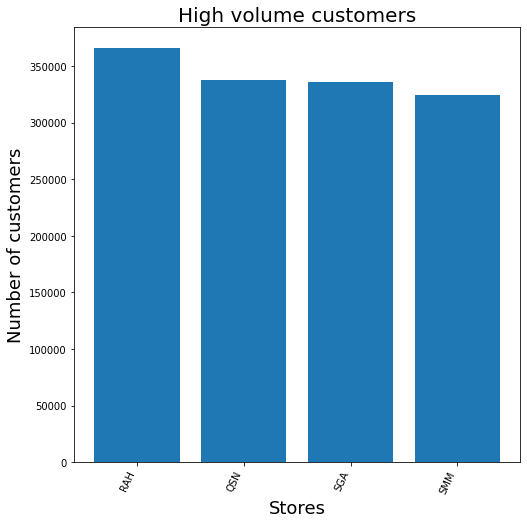

In [228]:
plt.figure(figsize=(8, 8))
x_pos = np.arange(len(data[High_Volume_list].columns))
plt.bar(x_pos, data[High_Volume_list].sum(), align='center')
plt.xticks(x_pos, data[High_Volume_list].columns,)
plt.xticks(rotation=65, ha='right')
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Number of customers', fontsize=18)
plt.title('High volume customers', fontsize=20)
plt.show()


**Explanation:**

The above Bar-graph shows the high voulme of customers(more than 300000 Customers) visit the store in year 2019.

## Bar-Graph to show medium volume of customer that visit the particular store in year 2019 .

            PAA  RGS  QMD  OSG  PGL  NAQ  OMV  MUY
Date                                              
2019-01-01  556  419  527  400  386  356  422  309
2019-01-02  510  441  464  447  452  412  343  368
2019-01-03  447  540  430  400  361  393  386  363
2019-01-04  458  497  359  407  366  325  240  225
2019-01-05  435  395  486  319  320  314  381  311


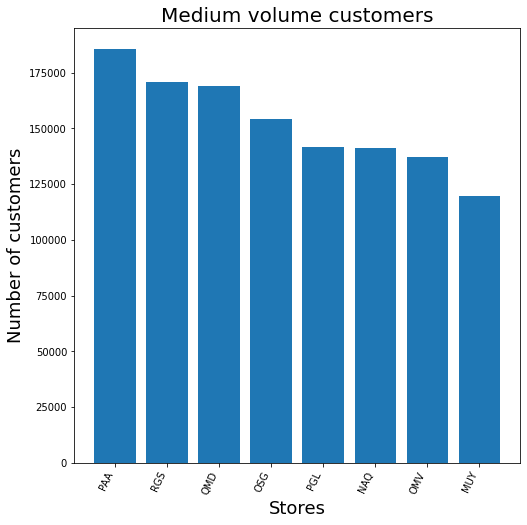

In [229]:
print(data[Medium_Volume_list].head())

plt.figure(figsize=(8, 8))
x_pos = np.arange(len(data[Medium_Volume_list].columns))
plt.bar(x_pos, data[Medium_Volume_list].sum(), align='center')
plt.xticks(x_pos, data[Medium_Volume_list].columns,)
plt.xticks(rotation=65, ha='right')
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Number of customers', fontsize=18)
plt.title('Medium volume customers', fontsize=20)
plt.show()


**Explanation:** 

The above Bar-graph shows the Medium voulme of customers(more than 100000 Customers) visit the store in year 2019.

#Bar-Graph to show low volume of customers that visit the particular store in year 2019 .

            EFN  WMB  ENY  TSE  WYG  BTB  ...  CNQ  DTJ  VYZ  WGR  ATT  DZT
Date                                      ...                              
2019-01-01   75   86   76   98   89   81  ...   62   77   56   68   59   59
2019-01-02   68   91  100   85   98   77  ...   55   63   74   59   50   58
2019-01-03   81   83   67   80   80   72  ...   84   70   59   72   66   60
2019-01-04   57   77   80   78   64   76  ...   70   67   66   50   49   60
2019-01-05   82   91   83   88   62   79  ...   59   63   60   50   42   62

[5 rows x 20 columns]


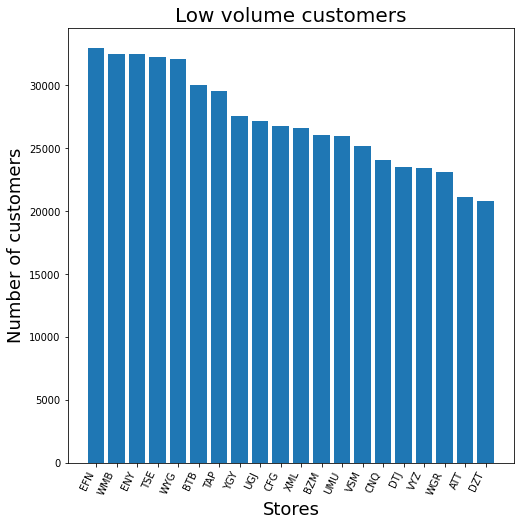

In [230]:
print(data[Low_Volume_list].head())

plt.figure(figsize=(8, 8))
x_pos = np.arange(len(data[Low_Volume_list].columns))
plt.bar(x_pos, data[Low_Volume_list].sum(), align='center')
plt.xticks(x_pos, data[Low_Volume_list].columns,)
plt.xticks(rotation=65, ha='right')
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Number of customers', fontsize=18)
plt.title('Low volume customers', fontsize=20)
plt.show()



**Explanation:** 

The above Bar-graph shows the low volume of customers(between 20000-50000 Customers) visit the store in year 2019.

#Bar-Graph to show very low volume of customers that visit the particular store in year 2019 .

            XSV  NMO  ZMS  YYO  AEI  NGB  MAJ  ZSD
Date                                              
2019-01-01   76    0   61    0    0    0    0    0
2019-01-02   92    0   58    0    0    0    0    0
2019-01-03   71    0   58    0    0    0    0    0
2019-01-04  105    0   51    0    0    0    0    0
2019-01-05   72    0   63    0    0    0    0    0


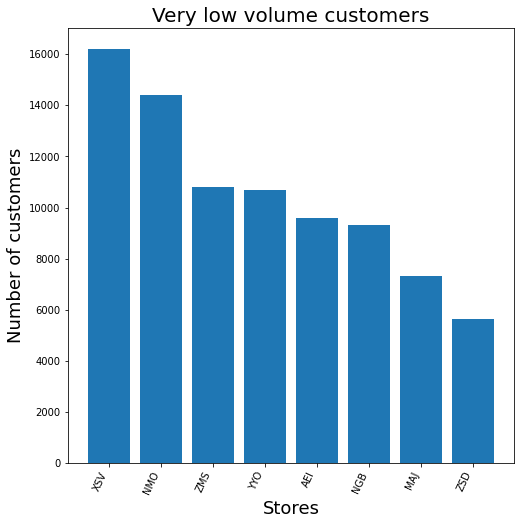

In [231]:
print(data[Verylow_Volume_list].head())

plt.figure(figsize=(8, 8))
x_pos = np.arange(len(data[Verylow_Volume_list].columns))
plt.bar(x_pos, data[Verylow_Volume_list].sum(), align='center')
plt.xticks(x_pos, data[Verylow_Volume_list].columns,)
plt.xticks(rotation=65, ha='right')
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Number of customers', fontsize=18)
plt.title('Very low volume customers', fontsize=20)
plt.show()

**Explanation:** 

The above Bar-graph shows the very low volume of customers(less than 20000) visit the store in year 2019.

#Representation of all store's customer data using line plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
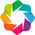

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [232]:
plot = data.hvplot.line(
    frame_height=900, frame_width=700, xlabel='Date', 
    ylabel='Customers', title='Total customers that visit the store '
    )
hv.extension('bokeh')
plot

**Explanation:**

The above Line plot describes the whole dataframe of the customer that visits the store in ther year 2019. Where Y-axis shows the total number of Customers while X-axis shows the Date. It can be notice that there are to much noise in the data so it is difficult to analyse the data from the above line plot. But we can notice the huge difference where we can see that there is no data of the starting months of some stores. So to find out what data are missing I will make a separate Line plot for each Volume of Data in the next chart.

# Lineplot for high volume customer data

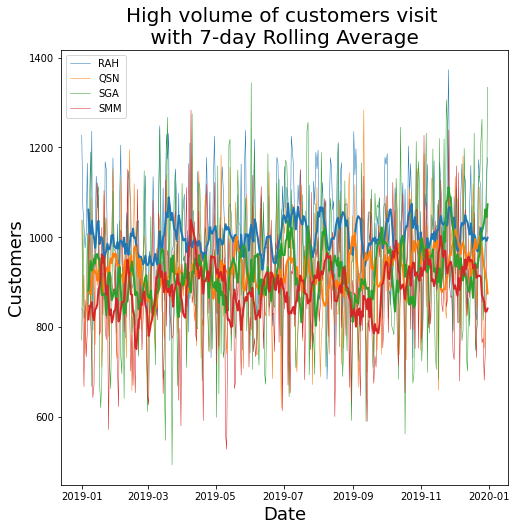

In [233]:
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)

period = 7 
rolling_average = data.rolling(window=period).mean()

plt.figure(figsize=(8, 8))
plt.plot(data[High_Volume_list], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[High_Volume_list], linewidth=2)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('High volume of customers visit \n with 7-day Rolling Average ', fontsize=20)
plt.legend(data[High_Volume_list].columns, loc=2)
plt.show()


**Explanation:**

From above High volume Customers data Line plot with 7-days rolling average,it can be notice that there are no missing data available over the period and also there is to much noise in the High volume Customers data. Here, rolling average is used to show smoothness in data so we can analyse data easily.

# Lineplot for medium volume customer data

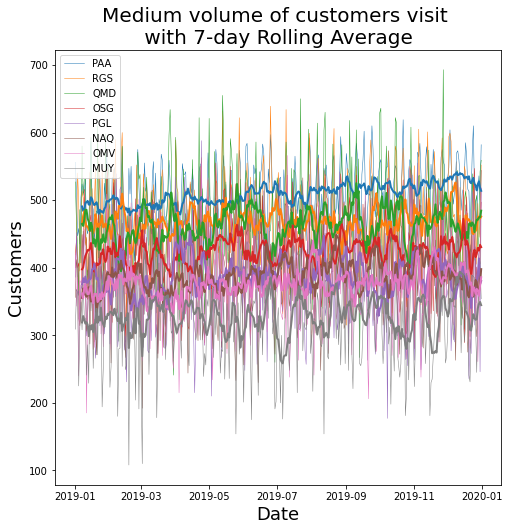

In [234]:
period = 7 
rolling_average = data.rolling(window=period).mean()

plt.figure(figsize=(8, 8))
plt.plot(data[Medium_Volume_list], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[Medium_Volume_list], linewidth=2)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('Medium volume of customers visit \n with 7-day Rolling Average ', fontsize=20)
plt.legend(data[Medium_Volume_list].columns, loc=2)
plt.show()


**Explanation:**

From above Medium volume Customers data Line plot with 7-days rolling average It can be notice that there are no missing data available over the period and also there is to much noise in the Medium volume Customers data.

#Lineplot for low volume customer data

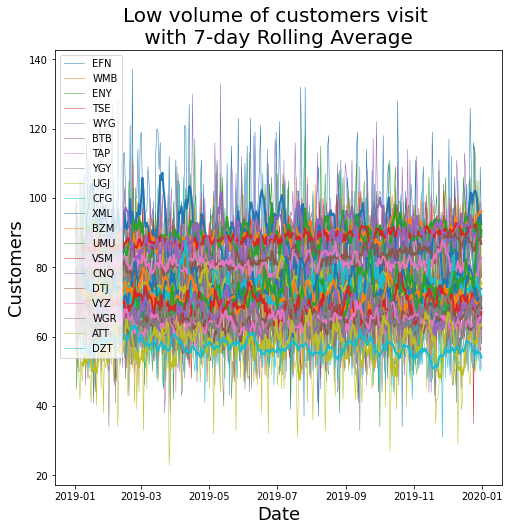

In [235]:
period = 7 
rolling_average = data.rolling(window=period).mean()

plt.figure(figsize=(8, 8))
plt.plot(data[Low_Volume_list], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[Low_Volume_list], linewidth=2)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('Low volume of customers visit \n with 7-day Rolling Average ', fontsize=20)
plt.legend(data[Low_Volume_list].columns, loc=2)
plt.show()


**Explanation:**

The above Line plot with 7-days rolling average shows the Low volume Customers data. It can be notice that there are no missing data available over the period.

#Very low volume data using interactive visualisation hvline plot to find out the missing data

            XSV  NMO  ZMS  YYO  AEI  NGB  MAJ  ZSD
Date                                              
2019-01-01   76    0   61    0    0    0    0    0
2019-01-02   92    0   58    0    0    0    0    0
2019-01-03   71    0   58    0    0    0    0    0
2019-01-04  105    0   51    0    0    0    0    0
2019-01-05   72    0   63    0    0    0    0    0
...         ...  ...  ...  ...  ...  ...  ...  ...
2019-12-27    0  124    0  157   31  144   77   48
2019-12-28    0  108    0   36   28   67    0   60
2019-12-29    0   96    0  109  102   83  172  114
2019-12-30    0   86    0   26   57  138  138   37
2019-12-31    0   99    0  127   52  145  180  123

[365 rows x 8 columns]


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
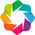

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [236]:
print(data[Verylow_Volume_list])
plot = data[Verylow_Volume_list].hvplot.line(
    frame_height=500, frame_width=500, xlabel='Date', 
    ylabel='Customers', title='Very low volume of customer visits'
    )
hv.extension('bokeh')
plot

**Explanation:**
The above hvline plot shows the very low volume customers data less than 20000 total. Using Interactive Visualisation we can analyse data in deep with help of given functionality such as pan,Zoom,wheel-zoom,save,refresh and hover button. so we can have point-to-point detail about each datapoint by hovering on the line. We can zoom-in data to see minute of details. We can refersh the changes we have made into.and also we can save the graph.
It can be seen from the line plot that there are some data missing from the starting months of the year.It is still quit hard to find out which store has missing data in the chart. so, it needs some monthly resampling techniques in order to see monthly data of each store instead of daily data.

#Very low volume data with monthly resampling of data showing the interactive visualisation hvline plot, Box-plot to find out the missing data and an Unexpected data behaviour i.e. anomalies.

Index(['XSV', 'NMO', 'ZMS', 'YYO', 'AEI', 'NGB', 'MAJ', 'ZSD'], dtype='object')
             XSV   NMO   ZMS   YYO   AEI   NGB   MAJ   ZSD
Date                                                      
2019-01-31  2690     0  1799     0     0     0     0     0
2019-02-28  2521     0  1652     0     0     0     0     0
2019-03-31  2703     0  1855     0     0     0     0     0
2019-04-30  2702   819  1818     0   232     0     0     0
2019-05-31  2735  1054  1854     0   453     0     0     0
2019-06-30  2864   925  1806     0   669     0     0     0
2019-07-31     0  1342     0  1702   795   555     0     0
2019-08-31     0  1533     0   934  1192   968     0     0
2019-09-30     0  2057     0  1821  1132  1367     0     0
2019-10-31     0  2204     0  1521  1512  1670  2030  1707
2019-11-30     0  1957     0  1987  1703  2065  2199  1432
2019-12-31     0  2506     0  2733  1917  2690  3077  2511


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
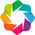

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [237]:
sample_rate = 'M'

selected_Low = data[Verylow_Volume_list].resample(sample_rate).sum()

print(selected_Low.columns)
print(selected_Low)

plot = selected_Low[Verylow_Volume_list].hvplot.line(
    frame_height=500, frame_width=500, xlabel='Date', 
    ylabel='Customers', title='Very low volume of customer visits with monthly resampling'
    )
hv.extension('bokeh')
plot


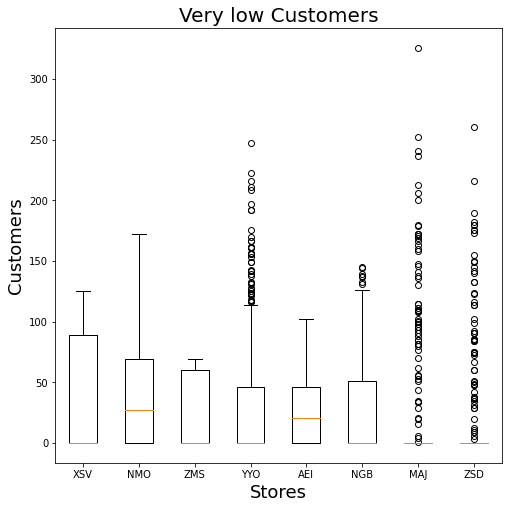

In [238]:
plt.figure(figsize=(8, 8))

plt.boxplot(data[Verylow_Volume_list].transpose(), labels=Verylow_Volume_list)
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('Very low Customers', fontsize=20)
plt.show()

In [239]:
sample_rate = 'M'

selected_High = data[High_Volume_list].resample(sample_rate).sum()
selected_Medium = data[Medium_Volume_list].resample(sample_rate).sum()
selected_Low = data[Low_Volume_list].resample(sample_rate).sum()
selected_VeryLow = data[Verylow_Volume_list].resample(sample_rate).sum()

print(selected_High)
print(selected_Medium)
print(selected_Low)
print(selected_VeryLow)

              RAH    QSN    SGA    SMM
Date                                  
2019-01-31  31220  28660  27971  26680
2019-02-28  27222  25668  24743  23701
2019-03-31  30870  27747  27510  26930
2019-04-30  29939  27415  27721  28518
2019-05-31  30709  28862  28229  26452
2019-06-30  29694  26850  27531  26357
2019-07-31  32031  29068  28800  27382
2019-08-31  31159  27827  28520  27641
2019-09-30  30068  27998  27876  25489
2019-10-31  31357  29457  28653  28721
2019-11-30  30182  28421  28870  28022
2019-12-31  31428  29499  29944  28135
              PAA    RGS    QMD    OSG    PGL    NAQ    OMV    MUY
Date                                                              
2019-01-31  15319  14353  14264  12871  11745  11370  11402  10092
2019-02-28  13764  12841  12341  11682  10500  10802  10702   8820
2019-03-31  15273  14337  14011  12693  11558  11396  10746  10304
2019-04-30  15044  14238  13453  12496  12290  11619  11159   9893
2019-05-31  15359  14520  14877  13631  12035  11609

**Explanation:** 
I have used the Interactive visualisation line plot with monthly resampling of data of year 2019. Using Interactive Visualisation, we can analyse data in deep with help of given functionality such pan,Zoom,wheel-zoom,save,refresh and hover button. so we can have point-to-point detail about each datapoint by hovering on the line and zooming option make easy to identify minute of details.

From the above Interactive visualisation line plot and statistic, it can be notice that the stores having very low volume customer have a dramatic change. It can be noticed from the statistics as well as line plot that there are 8 stores in which some stores have a zero data available for some months. Such as Store XSV and ZMS have zero data after six-months, so we can consider it as a store closed after the 6th-month.while, we can see that the Store NMO,YYO,AEI,NGB,MAJ and ZSD have zero data for some starting months of the year, so we can consider it as store open after the number of customer is available.

The Box-plot shows the anomalies(outliers) found in the stores YYO,NGB,MAJ,ZSD.


#Correlation: To find out any Correlation in dataset

# Heatmap showing correlation between all stores having high and medium volume customers.

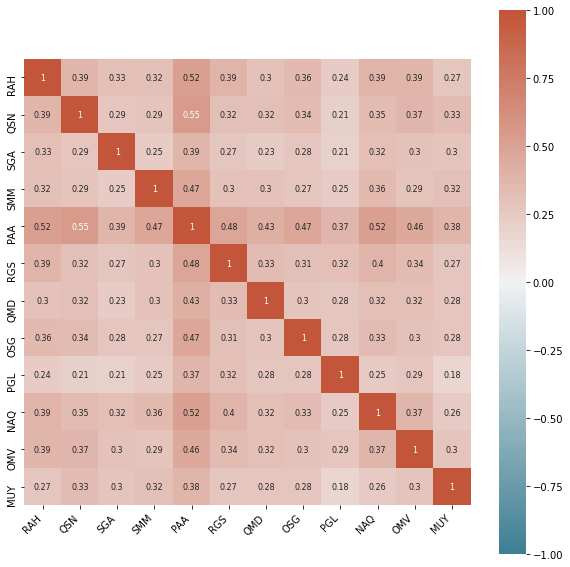

In [240]:
plt.figure(figsize=(10,10))


corr = data[combine_high_medium].corr()

ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200),square=True, annot=True, annot_kws={"size":8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

**Explanation**

The above graph represents Heatmap to findout if there is any correlation exists between all high and medium volume customer visiting the different stores. where there is one scale (right-side of the graph) is given to identify what type of correlation is there between each stores. Dark brown and blue color represents strong positive and strong negative correlation respectively. lighter shades describes low correlations. 

# Correlogram/ pair-plot.

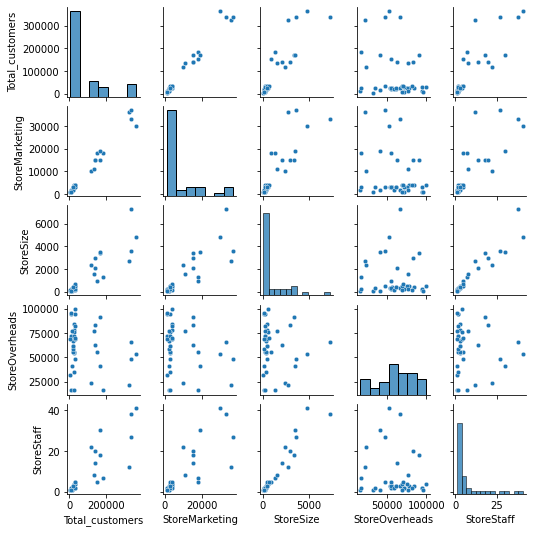

In [241]:
sns.pairplot(Summary_data, height=1.5, plot_kws={'s': 20})
plt.show()

**Explanation**

The above graph shwos the correlation between all five-variables of Summary_data(Total_Customers, StoreMarketing, StoreSize, StoreStaff, StoreOverheads).

## Correlation of summary_data on Heatmap

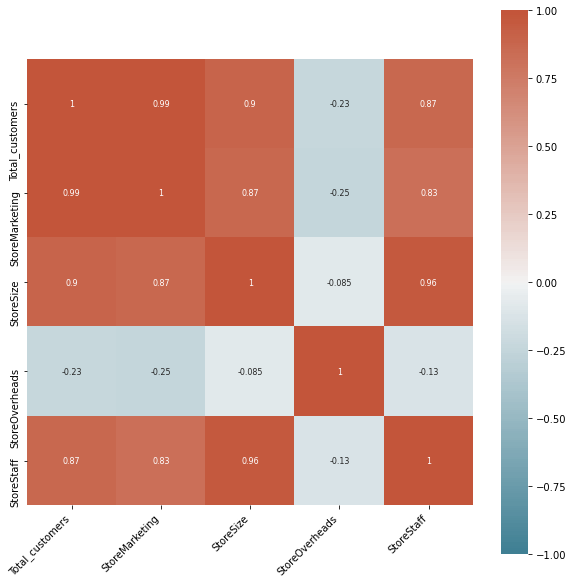

In [242]:
plt.figure(figsize=(10,10))

corr = Summary_data.corr()

ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200),square=True, annot=True, annot_kws={"size":8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

**Explanation**

The above graph represents Heatmap to find out if there is any correlation exists between Summary Data. where there is one scale (right-side of the graph) has given to identify what type of correlation is there between each stores. Dark brown and blue color represents strong positive and strong negative correlation respectively. lighter shades describe low correlations.

#Customer visits for the stores having mixed volume of customers data using Box-plot to find out any outliers present in customer data.

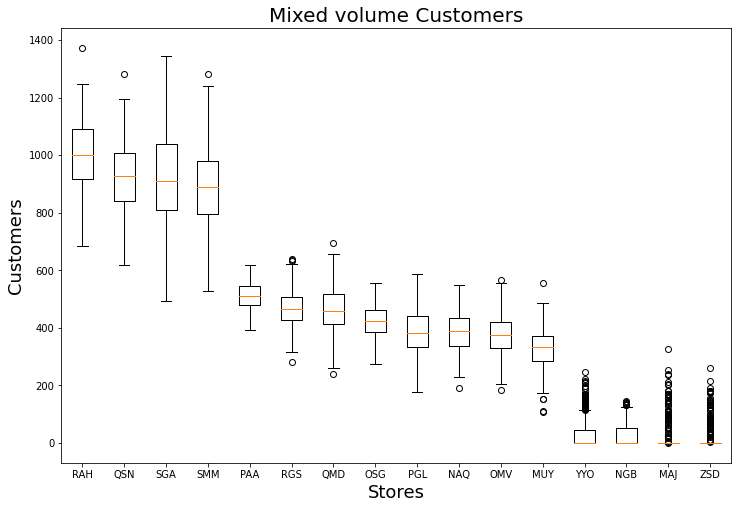

In [243]:
plt.figure(figsize=(12, 8))

selected = ['YYO','NGB','MAJ','ZSD']

outliers = combine_high_medium + selected

plt.boxplot(data[outliers].transpose(), labels=outliers)
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('Mixed volume Customers', fontsize=20)
plt.show()

**Explanation**

The above graph represents the Box-Plot graph to find outliers in data.
The box represents the 50% of the data, orange-line shows the median and upper-lower line of box (whisker) shows the maximum 1.5time data of the dataset, however the out-side of the whisker , that bubble describes the outliers. Outliers here is a exceed data on any certain point. 

#Seasonality detection: Lineplot-decomposition for high volume customer data

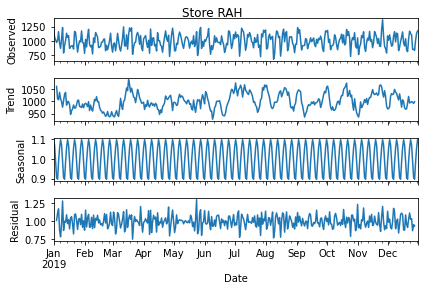

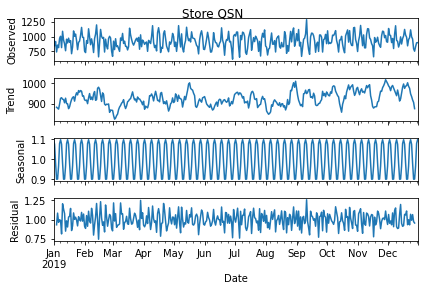

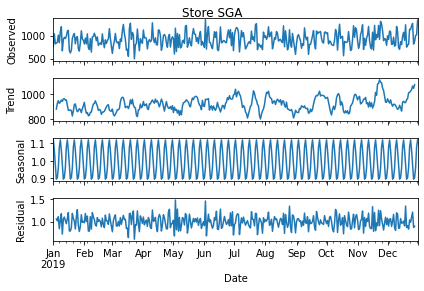

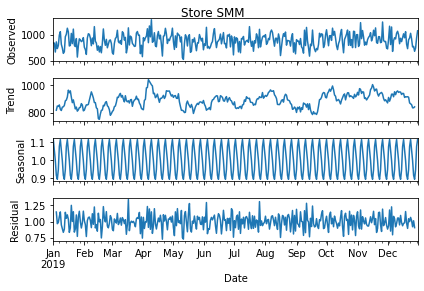

In [244]:
for name in High_Volume_list:
    result = seasonal_decompose(data[name], model='multiplicative', freq=7)
    result.plot()
    plt.suptitle('Store ' + name, position=(0.5, 1.0))
    plt.show()

**Explanation**

Lineplot-decomposition to find out any weekly seasonality with the high volume customer visits to the particular store in year 2019

#Radar subplots for some store having mixed(high, medium and verylow) volume of customers

In [245]:
print(Summary_data)
print(Summary_data.max())
normalised_data = Summary_data / Summary_data.max()
print(normalised_data.head())

     Total_customers  StoreMarketing  StoreSize  StoreOverheads  StoreStaff
MUY           119761           10000       2359           24000          22
XSV            16215            2000         97           41000           1
ZSD             5650            1000         51           32000           1
OSG           154388           18000        918           55000           5
RGS           170752           15000       3387           91000          18
ATT            21163            3000        408           62000           3
ZMS            10784            2000         71           16000           1
CFG            26806            4000        468           78000           3
UMU            26012            3000        315           54000           3
NAQ           141175           15000       2080           63000          14
UGJ            27140            3000        384           56000           3
PAA           185787           18000       1268           17000           7
SMM         

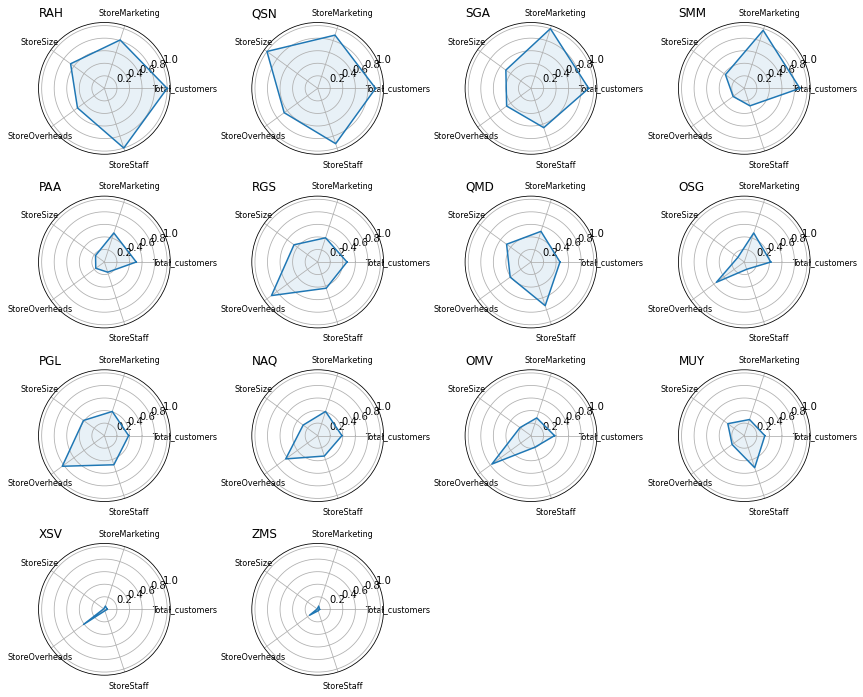

In [246]:
n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]

Store_Closed = ['XSV','ZMS']
store_metrics = combine_high_medium + Store_Closed

plt.figure(figsize=(12, 12))
counter = 1
for name in store_metrics:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(5, 4, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title( name, fontsize=12, loc='left')
    counter += 1
plt.tight_layout()
plt.show()

**Explanation**

The above plot shows the Radar plot for some stores to compare the summary_data variables/columns/features. 
There five dimensions in the above Radar plot, situated on the certain point of the circumference of circle. 

#Bubble plot for StoreMarketing Vs StoreSize(Vs Total customers)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
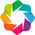

:Scatter   [StoreMarketing]   (StoreSize,BubbleSize,index,Total_customers,StoreOverheads,StoreStaff)

In [247]:
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)
Summary_data['BubbleSize'] = Summary_data['Total_customers'] * 0.01

plot = Summary_data.hvplot.scatter(
    frame_height=500, frame_width=500,
    title='StoreMarketing vs StoreSize (vs Total_customers)',
    xlabel='StoreMarketing (£)', ylabel='StoreSize (msq)',
    alpha=0.5, padding=0.1, hover_cols='all',
    x='StoreMarketing', y='StoreSize', size='BubbleSize'
)
hv.extension('bokeh')
plot


**Explanation**

The above plot shows the Bubble plot is to represents the three entities in a single plot. 